In [1]:
# Import libraries for EDA analysis
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.graph_objects as go
import plotly.express as px
import warnings
import joblib
warnings.filterwarnings("ignore")
plt.style.use("fivethirtyeight")
pd.set_option("display.max_columns", None)

In [2]:
# Read csv file with pandas
path = "C:/Users/USER/Documents/macQaries/bank cluster/data/train.csv"
train = pd.read_csv(path, sep = ";")

In [3]:
# Assign the train dataset to df and view data
df = train.copy()
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [4]:
df.shape

(45211, 17)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [6]:
# Check for duplicates
df.duplicated().sum()

0

In [7]:
# Display features with missing values
missingdfsum = df.isnull().sum()
missingdfpercent = round(missingdfsum/len(df)*100, 1)
missingdf = pd.concat([missingdfsum, missingdfpercent], axis = 1)
missingdf.columns = ["missing_counts", "missing_percent"]
missingdf

,missing_counts,missing_percent
age,0,0.0
job,0,0.0
marital,0,0.0
education,0,0.0
default,0,0.0
balance,0,0.0
housing,0,0.0
loan,0,0.0
contact,0,0.0
day,0,0.0


In [8]:
# View number of unique values for feature variables
df.nunique()

age            77
job            12
marital         3
education       4
default         2
balance      7168
housing         2
loan            2
contact         3
day            31
month          12
duration     1573
campaign       48
pdays         559
previous       41
poutcome        4
y               2
dtype: int64

In [9]:
# Define a function for listing categorical variables so we check for consistency
def category(df):
    cat_list = []
    for x in df.columns:
        if df[x].dtypes == "object":
            cat_list.append(x)
    return cat_list

In [10]:
# Print unique values for categorical variables
cat_list = category(df)
for col in cat_list:
    print(f"{col} \n {df[col].unique()} \n {'_'*100} \n")

job 
 ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student'] 
 ____________________________________________________________________________________________________ 

marital 
 ['married' 'single' 'divorced'] 
 ____________________________________________________________________________________________________ 

education 
 ['tertiary' 'secondary' 'unknown' 'primary'] 
 ____________________________________________________________________________________________________ 

default 
 ['no' 'yes'] 
 ____________________________________________________________________________________________________ 

housing 
 ['yes' 'no'] 
 ____________________________________________________________________________________________________ 

loan 
 ['no' 'yes'] 
 ____________________________________________________________________________________________________ 

contact 
 ['unknown' 'cellular' 'telephone'] 
 __

In [11]:
# Print value counts for all features
columns = df.columns.tolist()
for col in columns:
    print(f"{col} \n")
    print(f"{df[col].value_counts()} \n {'_'*100} \n")

age 

age
32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
93       2
90       2
95       2
88       2
94       1
Name: count, Length: 77, dtype: int64 
 ____________________________________________________________________________________________________ 

job 

job
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: count, dtype: int64 
 ____________________________________________________________________________________________________ 

marital 

marital
married     27214
single      12790
divorced     5207
Name: count, dtype: int64 
 ____________________________________________________________________________________________________ 

education 

education
secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: count, dtype: 

In [12]:
# Check for inaccuracy in age
df.sort_values(by = "age", ascending = True).head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
42954,18,student,single,unknown,no,108,no,no,cellular,9,feb,92,1,183,1,success,yes
41273,18,student,single,unknown,no,3,no,no,cellular,25,aug,130,2,-1,0,unknown,yes
42146,18,student,single,secondary,no,156,no,no,cellular,4,nov,298,2,82,4,other,no
43637,18,student,single,unknown,no,348,no,no,cellular,5,may,443,4,-1,0,unknown,yes
40736,18,student,single,primary,no,1944,no,no,telephone,10,aug,122,3,-1,0,unknown,no


Since we will be segmenting our dataset, we will only include features that captures characteristics relevant to uncovering meaningful groups in the data.

In [13]:
# Drop unwanted features
columns_to_drop = ["poutcome", "pdays", "day", "month", "contact", "campaign", "duration","previous", "y"]
df.drop(columns = columns_to_drop, inplace = True)

In [14]:
# Replace unknown values with mode
columns = ["education", "job"]
for column in columns:
    df[column].replace(["unknown"], df[column].mode(), inplace = True)

In [15]:
df.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,secondary,no,1506,yes,no
4,33,blue-collar,single,secondary,no,1,no,no


In [16]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0


In [17]:
df.info()                                               

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
dtypes: int64(2), object(6)
memory usage: 2.8+ MB


In [18]:
# Save wrangled data
df.to_csv("C:/Users/USER/Documents/macQaries/bank cluster/data/wrangled_data.csv", index = False)

### Preprocessing

In [19]:
# Import libraries for modeling and evaluation
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, accuracy_score, calinski_harabasz_score, davies_bouldin_score, silhouette_score
from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer
import shap
import prince
import lightgbm as lgb

In [20]:
# Assign the wrangled dataset to df_pp
df_pp = df.copy()

In [21]:
df_pp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
dtypes: int64(2), object(6)
memory usage: 2.8+ MB


In [22]:
df_pp.head()

,age,job,marital,education,default,balance,housing,loan
0,58,management,married,tertiary,no,2143,yes,no
1,44,technician,single,secondary,no,29,yes,no
2,33,entrepreneur,married,secondary,no,2,yes,yes
3,47,blue-collar,married,secondary,no,1506,yes,no
4,33,blue-collar,single,secondary,no,1,no,no


In [23]:
# Preprocess data for clustering
onehot_trans = Pipeline(steps = [
    ("encoder", OneHotEncoder(handle_unknown = "ignore", drop = "first", sparse = False)) 
])
ordinal_trans = Pipeline(steps = [
    ("encoder", OrdinalEncoder()) 
])
numeric_trans = Pipeline(steps = [
    ("encoder", PowerTransformer()) 
])

preprocessor = ColumnTransformer(
    transformers = [
        ("oht", onehot_trans, ["job", "marital", "default", "housing", "loan"]),
        ("cat", ordinal_trans, ["education"]),
        ("num", numeric_trans, ["age", "balance"])
    ]
)

pipeline = Pipeline(steps = [("preprocessor", preprocessor)])
pipe_fit = pipeline.fit(df_pp)

df_km = pd.DataFrame(pipe_fit.transform(df_pp), columns = pipe_fit.get_feature_names_out())
print(df_km.columns)

Index(['oht__job_blue-collar', 'oht__job_entrepreneur', 'oht__job_housemaid',
       'oht__job_management', 'oht__job_retired', 'oht__job_self-employed',
       'oht__job_services', 'oht__job_student', 'oht__job_technician',
       'oht__job_unemployed', 'oht__marital_married', 'oht__marital_single',
       'oht__default_yes', 'oht__housing_yes', 'oht__loan_yes',
       'cat__education', 'num__age', 'num__balance'],
      dtype='object')


In [24]:
df_km.head()

,oht__job_blue-collar,oht__job_entrepreneur,oht__job_housemaid,oht__job_management,oht__job_retired,oht__job_self-employed,oht__job_services,oht__job_student,oht__job_technician,oht__job_unemployed,oht__marital_married,oht__marital_single,oht__default_yes,oht__housing_yes,oht__loan_yes,cat__education,num__age,num__balance
0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,1.473637,0.414773
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.429379,-0.410774
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,-0.709873,-0.431122
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.683128,0.197685
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,-0.709873,-0.432119


In [25]:
# Predict and eliminate outliers
clf = ECOD()
clf.fit(df_km)
outliers = clf.predict(df_km)

In [26]:
# Data without outlier
df_km["outliers"] = outliers
no_outlier = df_km[df_km["outliers"] == 0]
no_outlier.drop(["outliers"], axis = 1, inplace = True)

In [27]:
# Data with outlier
with_outlier = df_km.copy()
with_outlier.drop(["outliers"], axis = 1, inplace = True)

In [28]:
# Original data without outlier
df["outliers"] = outliers
df_no_outlier = df[df["outliers"] == 0]
df_no_outlier.drop("outliers", axis = 1, inplace = True)

In [29]:
print(with_outlier.shape)
print(no_outlier.shape)
print(df_no_outlier.shape)

(45211, 18)
(40690, 18)
(40690, 8)


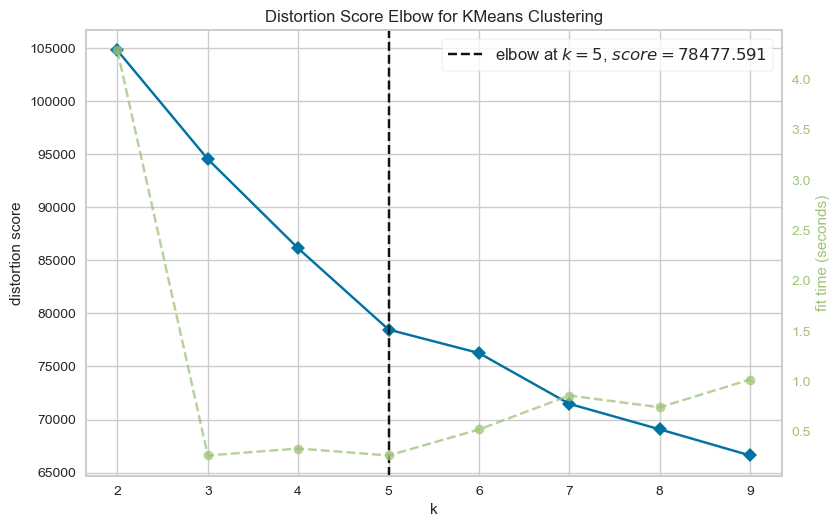

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [30]:
# Instantiate the clustering model and visualizer, and fit the data to the visualizer
kmn = KMeans(init = "k-means++", random_state = 42, n_init = "auto")
visualizer = KElbowVisualizer(kmn, k = (2, 10))
visualizer.fit(no_outlier)
visualizer.show()

In [31]:
# The best value for k is between 7-5
value = [5, 6, 7]
for k in value:
    km = KMeans(n_clusters = k, init = "k-means++", n_init = 10, max_iter = 100, random_state = 42)
    clusters = km.fit_predict(no_outlier)
    print(f"Davies Bouldin score for {k} : {davies_bouldin_score(no_outlier, clusters)}")
    print(f"Calinski score for {k} : {calinski_harabasz_score(no_outlier, clusters)}")

Davies Bouldin score for 5 : 1.6634563824949513
Calinski score for 5 : 6865.993969275907
Davies Bouldin score for 6 : 1.7834076552090397
Calinski score for 6 : 6259.25098733908
Davies Bouldin score for 7 : 1.7864806605568462
Calinski score for 7 : 5774.527725978232


In [32]:
# The best value for k is between 5. we will model our data with n_cluster = 5
km = KMeans(n_clusters = 5, init = "k-means++", n_init = 10, max_iter = 100, random_state = 42)
clusters = km.fit_predict(no_outlier)
print(km.inertia_)
print(np.unique(clusters))

78477.62894475879
[0 1 2 3 4]


In [33]:
# Evaluate our model with Davies, and Calinski score metric
print(f"Davies Bouldin score : {davies_bouldin_score(no_outlier, clusters)}")
print(f"Calinski score : {calinski_harabasz_score(no_outlier, clusters)}")

Davies Bouldin score : 1.6634563824949513
Calinski score : 6865.993969275907


In [34]:
# Function that calculates the principal components in 2D
def get_pca2d(df, predict):
    pca_2d_obj = prince.PCA(
        n_components = 2, n_iter = 3,
        rescale_with_mean = True,
        rescale_with_std = True,
        copy = True, check_input = True,
        engine = "sklearn", random_state = 42)
    pca_2d_obj.fit(df)
    pca_2d_df = pca_2d_obj.transform(df)
    pca_2d_df.columns = ["component1", "component2"]
    pca_2d_df["cluster"] = predict
    
    return pca_2d_obj, pca_2d_df

# Function that calculates the principal components in 3D
def get_pca3d(df, predict):
    pca_3d_obj = prince.PCA(
        n_components = 3, n_iter = 3,
        rescale_with_mean = True,
        rescale_with_std = True,
        copy = True, check_input = True,
        engine = "sklearn", random_state = 42)
    pca_3d_obj.fit(df)
    pca_3d_df = pca_3d_obj.transform(df)
    pca_3d_df.columns = ["component1", "component2", "component3"]
    pca_3d_df["cluster"] = predict
    
    return pca_3d_obj, pca_3d_df

# Function that plot the principal components in 2D
def plot_pca_2d(df, title = "PCA space", opacity = 0.8, width_line = 0.1):
    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")
    fig = px.scatter(df, x = "component1", y = "component2",
                        color = "cluster", template = "plotly", color_discrete_sequence = px.colors.qualitative.Vivid,
                        title = title).update_traces(marker = {"size": 4, "opacity": opacity,
                                                               "line": {"width": width_line,
                                                                        "color": "black"}}
                                                    ).update_layout(width = 800, height = 800,
                                                                    autosize = True, showlegend = True,
                                                                    legend = dict(title_font_family = "Times New Roman",
                                                                                  font = dict(size = 20)),
                                                                    scene = dict(xaxis = dict(title = "Component1", titlefont_color = "black"),
                                                                                 yaxis = dict(title = "Component2", titlefont_color = "black")),
                                                                    font = dict(family = "Gilroy", color = "black", size = 15))
    
    fig.show()

# Function that plot the principal components in 3D
def plot_pca_3d(df, title = "PCA space", opacity = 0.8, width_line = 0.1):
    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")
    fig = px.scatter_3d(df, x = "component1", y = "component2", z = "component3",
                        color = "cluster", template = "plotly", color_discrete_sequence = px.colors.qualitative.Vivid,
                        title = title).update_traces(marker = {"size": 4, "opacity": opacity,
                                                               "line": {"width": width_line,
                                                                        "color": "black"}}
                                                    ).update_layout(width = 800, height = 800,
                                                                    autosize = True, showlegend = True,
                                                                    legend = dict(title_font_family = "Times New Roman",
                                                                                  font = dict(size = 20)),
                                                                    scene = dict(xaxis = dict(title = "Component1", titlefont_color = "black"),
                                                                                 yaxis = dict(title = "Component2", titlefont_color = "black"),
                                                                                 zaxis = dict(title = "Component3", titlefont_color = "black")),
                                                                    font = dict(family = "Gilroy", color = "black", size = 15))
    
    fig.show()

In [35]:
pca_3d_object, pca_3d_data = get_pca3d(no_outlier, clusters)

In [36]:
# Lets execute the function
plot_pca_3d(pca_3d_data, title = "3D PCA Space Visualization", opacity = 1)

In [37]:
# Check the variability of the PCA executed
print("The Variability is: ", pca_3d_object.eigenvalues_summary)

The Variability is:            eigenvalue % of variance % of variance (cumulative)
component                                                    
0              2.293        12.74%                     12.74%
1              1.793         9.96%                     22.70%
2              1.288         7.16%                     29.86%


In [38]:
# Lets execute the function
pca_2d_object, pca_2d_data = get_pca2d(no_outlier, clusters)
plot_pca_2d(pca_2d_data, title = "2D PCA Space Visualization", opacity = 1)

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Warning] Unknown parameter: colsample_by_tree
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002819 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 340
[LightGBM] [Info] Number of data points in the train set: 40690, number of used features: 8
[LightGBM] [Info] Start training from score -1.748567
[LightGBM] [Info] Start training from score -1.392754
[LightGBM] [Info] Start training from score -1.242299
[LightGBM] [Info] Start training from score -1.487431
[LightGBM] [Info] Start training from score -2.765975


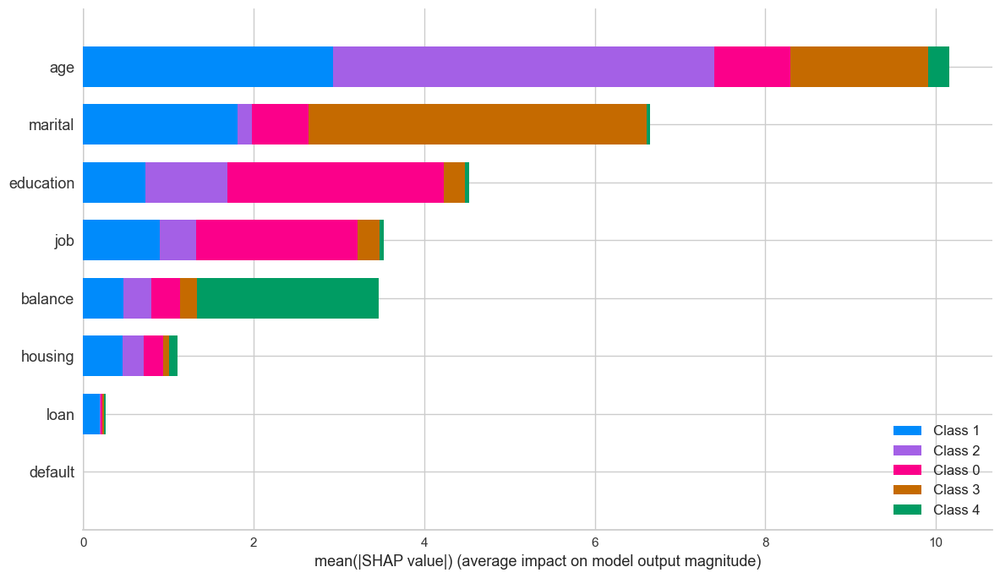

In [39]:
# Plot feature importance of our clustered dataset
clf_km = lgb.LGBMClassifier(colsample_by_tree = 0.8)
for col in ["job", "marital", "education", "default", "housing", "loan"]:
    df_no_outlier[col] = df_no_outlier[col].astype("category")
clf_km.fit(df_no_outlier, clusters, feature_name = "auto", categorical_feature = "auto")
# SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outlier)
shap.summary_plot(shap_values_km, df_no_outlier, plot_type = "bar", plot_size = (12, 7))

In [40]:
y_pred = clf_km.predict(df_no_outlier)
print("Training accuracy: {0:0.4f}".format(accuracy_score(y_pred, clusters)))
print(classification_report(clusters, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7081
           1       1.00      1.00      1.00     10107
           2       1.00      1.00      1.00     11748
           3       1.00      1.00      1.00      9194
           4       1.00      1.00      1.00      2560

    accuracy                           1.00     40690
   macro avg       1.00      1.00      1.00     40690
weighted avg       1.00      1.00      1.00     40690



In [41]:
df_no_outlier["clusters"] = clusters
df_no_outlier.shape

(40690, 9)

In [42]:
# Lets analyse the characteristics of the clusters
df_no_outlier.groupby("clusters").agg(
    {
        "job": lambda x: x.value_counts().index[0],
        "marital": lambda x: x.value_counts().index[0],
        "education": lambda x: x.value_counts().index[0],
        "housing": lambda x: x.value_counts().index[0],
        "loan": lambda x: x.value_counts().index[0],
        "age": lambda x: x.mean(),
        "balance": lambda x: x.mean(),
        "default": lambda x: x.value_counts().index[0]
    }
).reset_index()

,clusters,job,marital,education,housing,loan,age,balance,default
0,0,management,married,tertiary,no,no,42.296286,851.176529,no
1,1,blue-collar,married,secondary,yes,no,34.853171,582.568220,no
2,2,blue-collar,married,secondary,no,no,50.749830,828.457014,no
3,3,technician,single,secondary,yes,no,32.216010,792.015989,no
4,4,management,married,secondary,yes,no,42.450781,7208.873828,no
